In [1]:
import pandas as pd
import re
import numpy as np
import glob
import os
from collections import defaultdict
import networkx
from networkx.algorithms.components.connected import connected_components
from packages import npomix
import time
from datetime import datetime
from sklearn.metrics import jaccard_score

In [2]:
start = time.time()

In [3]:
edges_path = "./inputs/gnps_function/ProteoSAFe-METABOLOMICS-SNETS-V2-67f55c7d-download_cytoscape_data/bfcbd4d8e55c43e99283bb029c4bad89..selfloop"
nodes_path = "./inputs/gnps_function/ProteoSAFe-METABOLOMICS-SNETS-V2-67f55c7d-download_cytoscape_data/c985e9c2abe94283828bd01c94645a29.clustersummary"

In [4]:
nodes_df = pd.read_csv(nodes_path,sep='\t')

nodes_df[:5]

,AllGroups,DefaultGroups,EvenOdd,G1,G2,G3,G4,G5,G6,GNPSLinkout_Cluster,...,SpectrumID,UniqueFileSources,UniqueFileSourcesCount,cluster index,componentindex,number of spectra,parent mass,precursor charge,precursor mass,sum(precursor intensity)
0,,G1,1,8,0,0,0,0,0,https://gnps.ucsd.edu//ProteoSAFe/result.jsp?t...,...,NaN,Bact_vulg_CL09T03C04_V1.3.mzXML|Bact_sp_9_1_42...,7,2,-1,8,84.043,0,84.043,12004.0
1,,G1,1,14,0,0,0,0,0,https://gnps.ucsd.edu//ProteoSAFe/result.jsp?t...,...,NaN,Bacteroides_sp_1_1_30_V1.3.mzXML|Clos_bact_OBR...,12,4,-1,14,84.043,0,84.043,23389.0
2,,G1,1,20,0,0,0,0,0,https://gnps.ucsd.edu//ProteoSAFe/result.jsp?t...,...,NaN,Bacteroides_sp_1_1_30_V1.3.mzXML|Bact_sp_1_1_6...,12,6,1846,20,84.044,0,84.044,46212.0
3,,G1,1,16,0,0,0,0,0,https://gnps.ucsd.edu//ProteoSAFe/result.jsp?t...,...,NaN,Bacteroides_sp_1_1_30_V1.3.mzXML|Bact_sp_1_1_6...,13,11,1846,16,84.043,0,84.043,37704.0
4,,G1,1,6,0,0,0,0,0,https://gnps.ucsd.edu//ProteoSAFe/result.jsp?t...,...,NaN,Bact_thet_CL09T03C10_V1.3.mzXML|Bacteroides_sp...,4,35,-1,6,84.043,0,84.043,12097.0


In [5]:
clusterindex_list = []

for i,r in nodes_df.iterrows():
    if type(r['LibraryID']) == float:
        clusterindex_list.append(r['cluster index'])
        
clusterindex_list

[2,
 4,
 6,
 11,
 35,
 734,
 741,
 742,
 745,
 1149,
 3315,
 3343,
 3355,
 3397,
 3695,
 3704,
 3812,
 3867,
 3868,
 3890,
 3988,
 4068,
 4609,
 5012,
 5161,
 5181,
 5183,
 5197,
 5224,
 5297,
 5303,
 5351,
 5352,
 5453,
 5618,
 5621,
 5625,
 5639,
 5640,
 5643,
 5693,
 5697,
 6027,
 6029,
 6040,
 6044,
 6046,
 6108,
 6191,
 6261,
 6434,
 6845,
 6941,
 6999,
 7207,
 7250,
 7251,
 7252,
 7265,
 7407,
 7411,
 7412,
 7435,
 7497,
 7714,
 7795,
 9852,
 10153,
 10154,
 10155,
 10156,
 10157,
 10159,
 10163,
 11250,
 11301,
 11315,
 11322,
 11325,
 11340,
 11341,
 11344,
 11376,
 12048,
 12075,
 12222,
 12386,
 12391,
 12393,
 12404,
 12410,
 12413,
 12418,
 12420,
 12424,
 12425,
 12426,
 12427,
 12428,
 12456,
 12469,
 12498,
 12513,
 12531,
 12535,
 12605,
 12614,
 12674,
 12675,
 12690,
 12733,
 12734,
 12736,
 12858,
 12861,
 12983,
 13220,
 13222,
 13224,
 13231,
 13236,
 13248,
 13282,
 13283,
 13294,
 13303,
 13333,
 13336,
 13342,
 13343,
 13355,
 13359,
 13393,
 13394,
 13395,
 133

In [6]:
edges_df = pd.read_csv(edges_path,sep='\t')

def get_neighbors(target,dataframe,column1,column2):
    subset1 = dataframe[(dataframe[column1]==target)]
    subcat = subset1.append(dataframe[(dataframe[column2]==target)])
    temp_list = []
    for index,row in subcat.iterrows():
        temp_list.append(subcat[column1][index])
        temp_list.append(subcat[column2][index])
    temp_list = list(np.unique(temp_list))
    return temp_list

def to_edges(l):
    it = iter(l)
    last = next(it)
    for current in it:
        yield last, current
        last = current

def to_graph(l):
    G = networkx.Graph()
    for part in l:
        G.add_nodes_from(part)
        G.add_edges_from(to_edges(part))
    return G

def get_family_dict(components_list,dataframe,dictionary,column1,column2,column3):
    count = 0
    for family in list(components_list):
        count += 1
        for fam_member in family:
            dictionary['MF%s'%count].append(fam_member)
    return dictionary

def main_get_families(gnps_df):
    targets_list = np.unique([gnps_df.CLUSTERID1,gnps_df.CLUSTERID2])
    neighbors_list = []
    for target in targets_list:
        neighbors_list.append(get_neighbors(target,gnps_df,'CLUSTERID1','CLUSTERID2'))
    G = to_graph(neighbors_list)
    C = connected_components(G)
    mf_dict = defaultdict(list)
    mf_dict = get_family_dict(C,gnps_df,mf_dict,'CLUSTERID1','CLUSTERID2','Cosine')
    return mf_dict

mf_dict = main_get_families(edges_df)

mf_dict

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/tmp/ipykernel_75924/2825894952.py:5: FutureWarn

defaultdict(list,
            {'MF1': [2],
             'MF2': [4],
             'MF3': [6434,
              4068,
              13445,
              6,
              61689,
              5640,
              2060188,
              11,
              61648,
              3890,
              82035,
              17780,
              17788,
              5625,
              3868],
             'MF4': [35],
             'MF5': [734],
             'MF6': [741],
             'MF7': [742],
             'MF8': [3867, 745, 3355],
             'MF9': [1149],
             'MF10': [14875, 3315],
             'MF11': [3343],
             'MF12': [5181, 3397],
             'MF13': [3695],
             'MF14': [3704],
             'MF15': [7411, 3812, 7412, 7407],
             'MF16': [3988],
             'MF17': [4609],
             'MF18': [15552, 15585, 5012, 25748, 15546],
             'MF19': [5161],
             'MF20': [5297, 5197, 5183],
             'MF21': [5224],
             'MF22': [5303]

In [7]:
for ion in clusterindex_list:
    print(ion)

2
4
6
11
35
734
741
742
745
1149
3315
3343
3355
3397
3695
3704
3812
3867
3868
3890
3988
4068
4609
5012
5161
5181
5183
5197
5224
5297
5303
5351
5352
5453
5618
5621
5625
5639
5640
5643
5693
5697
6027
6029
6040
6044
6046
6108
6191
6261
6434
6845
6941
6999
7207
7250
7251
7252
7265
7407
7411
7412
7435
7497
7714
7795
9852
10153
10154
10155
10156
10157
10159
10163
11250
11301
11315
11322
11325
11340
11341
11344
11376
12048
12075
12222
12386
12391
12393
12404
12410
12413
12418
12420
12424
12425
12426
12427
12428
12456
12469
12498
12513
12531
12535
12605
12614
12674
12675
12690
12733
12734
12736
12858
12861
12983
13220
13222
13224
13231
13236
13248
13282
13283
13294
13303
13333
13336
13342
13343
13355
13359
13393
13394
13395
13398
13401
13403
13410
13412
13413
13414
13415
13418
13419
13425
13427
13429
13441
13445
13447
13451
13452
13481
13521
13533
13543
13564
13566
13569
13592
13598
13605
13607
13612
13614
13626
13627
13628
13634
13644
13652
13663
13665
13674
13678
13686
13696
13701
13718
1372

In [8]:
lcms_file_list = []

for item in nodes_df['UniqueFileSources']:
    for lcms_file in item.split('|'):
        if lcms_file not in lcms_file_list:
            print(lcms_file)
            lcms_file_list.append(lcms_file)

Bact_vulg_CL09T03C04_V1.3.mzXML
Bact_sp_9_1_42FAA_V2.3.mzXML
Blongum44Bv1.3.mzXML
SspCM7v1.2.mzXML
Clos_clos_2_1_49FAA_V1.3.mzXML
SspSR1v1.2.mzXML
Clos_orbi_1_3_50AFAA_V1.3.mzXML
Bacteroides_sp_1_1_30_V1.3.mzXML
Clos_bact_OBRC5-5_V1.2.mzXML
SspOBRC6v1.2.mzXML
Bact_frag_CL07T12C05_V1.3.mzXML
Bact_cacc_CL03T12C61_V1.3.mzXML
SspCM6v1.2.mzXML
Para_merd_CL03T12C32_V1.3.mzXML
Bact_dore_CL02T00C15_V1.3.mzXML
Bact_sp_1_1_6_V2.3.mzXML
Bact_cell_CL02T12C19_V1.3.mzXML
Bact_frag_CL07T00C01_V1.3.mzXML
Bact_ster_CC31F_V1.3.mzXML
Acti_vis_C505_V3.3.mzXML
Bact_thet_CL09T03C10_V1.3.mzXML
GCA_000012265.2.mzXML
GCA_000012265.1.mzXML
GCA_000506385.2.mzXML
GCA_003324555.1.mzXML
GCA_001562525.1.mzXML
GCA_001562525.2.mzXML
GCA_000506385.4.mzXML
GCA_003324555.2.mzXML
Blongum35Bv1.3.mzXML
Bact_dore_CL02T12C06_V1.3.mzXML
Bifi_brev_HPH0326_V1.3.mzXML
SspBS29av1.2.mzXML
Bact_frag_CL03T12C07_V1.3.mzXML
ERX2291258.1.mzXML
ERX2291921.1.mzXML
ERX2291789.1.mzXML
BspMSTE12v1.3.mzXML
B111.4.mzML
7961.3.mzML
M92.1.mzML
M

ERX2291287.1.mzXML
ERX2291959.1.mzXML
ERX2291421.1.mzXML
ERX2291858.1.mzXML
GCF_000714595.1.mzML
ERS4341557.1.mzXML
ERS4346460.1.mzXML
NIBV00000000.1.mzXML
NJAH00000000.1.mzXML
NIBU00000000.1.mzXML
ERS4341474.1.mzXML
ERS4346560.1.mzXML
ERS4341457.1.mzXML
ERS4346497.1.mzXML
ERS4346591.1.mzXML
ERX2291622.1.mzXML
ERX2291852.1.mzXML
ERX2291374.1.mzXML
ERS4346443.1.mzXML
ERS4356177.1.mzXML
ERS4356301.1.mzXML
ERS4356324.1.mzXML
ERS4346557.1.mzXML
ERS4346422.1.mzXML
2791354866.1.mzXML
2791354855.1.mzXML
ERS4341630.1.mzXML
ERS4341625.1.mzXML
ERS4341543.1.mzXML
ERX2291642.1.mzXML
GCF_000714595.4.mzML
GCF_000714595.3.mzML
GCF_000714595.5.mzML
GCF_000714595.6.mzML
GCF_000714595.2.mzML
ERS4356305.1.mzXML
ERS4356166.1.mzXML
ERX2291869.1.mzXML
ERX2291903.1.mzXML
ERX2291466.1.mzXML
ERS4341469.1.mzXML
ERX2291786.1.mzXML
ERX2291901.1.mzXML
GCA_000314005.1.mzML
GCA_000021805.1.mzML
GCA_000010065.1.mzML
GCA_000315585.1.mzML
GCA_000316575.1.mzML
GCA_000317635.1.mzML
GCA_000316665.1.mzML
GCA_003326215.1.mz

GCA_000377165.7.mzXML
2517572165.7.mzXML
GCA_000377165.8.mzXML
GCA_000377105.7.mzXML
GCA_000377965.14.mzXML
GCA_000377545.1.mzXML
GCA_000424825.6.mzXML
GCA_000156435.9.mzXML
GCA_000424845.7.mzXML
GCA_000424965.2.mzXML
GCA_000426325.8.mzXML
GCA_000156695.4.mzXML
GCA_000514995.7.mzXML
GCA_000240165.2.mzXML
GCA_000424765.8.mzXML
GCA_003610995.6.mzXML
GCA_000739105.1.mzXML
GCA_000426325.9.mzXML
GCA_000156695.6.mzXML
2517572165.9.mzXML
GCA_000514715.7.mzXML
GCA_000377965.5.mzXML
GCA_000701285.3.mzXML
GCA_000424825.9.mzXML
GCA_000482585.9.mzXML
GCA_000377965.29.mzXML
GCA_000424825.7.mzXML
GCA_000377125.8.mzXML
GCA_000424825.8.mzXML
GCA_000424785.9.mzXML
GCA_000702365.1.mzXML
GCA_000424965.7.mzXML
GCA_000377965.6.mzXML
2561511112.6.mzXML
GCA_000514715.8.mzXML
GCA_000156435.3.mzXML
GCA_000482585.7.mzXML
GCA_000377965.28.mzXML
GCA_000377965.4.mzXML
GCA_000415505.6.mzXML
GCA_000240165.1.mzXML
GCA_000377125.9.mzXML
GCA_000426165.8.mzXML
GCA_000701285.6.mzXML
GCA_000426165.9.mzXML
GCA_000412265.5.

In [9]:
len(lcms_file_list)

3240

In [10]:
def get_presence_files(nodes_df):
    for unique_list in list(nodes_df[nodes_df['cluster index'] == ion]['UniqueFileSources']):
        return list(unique_list.split('|'))

all_rows_list,testing_indexes_list = [],[]
for ion in clusterindex_list:
    subset_edges = edges_df[(edges_df.CLUSTERID1 == ion) | (edges_df.CLUSTERID2 == ion)]
    cosine = round(max(subset_edges['Cosine']),2)
    presence_list = get_presence_files(nodes_df)
    single_row_list = []
    for lcms_file in lcms_file_list:
        if lcms_file in presence_list:
            single_row_list.append(cosine)
        else:
            single_row_list.append(0)
    all_rows_list.append(single_row_list)
    testing_indexes_list.append(ion)
    
all_rows_list

pre_testing_df = pd.DataFrame(all_rows_list,index=testing_indexes_list,columns=lcms_file_list)

pre_testing_df

,Bact_vulg_CL09T03C04_V1.3.mzXML,Bact_sp_9_1_42FAA_V2.3.mzXML,Blongum44Bv1.3.mzXML,SspCM7v1.2.mzXML,Clos_clos_2_1_49FAA_V1.3.mzXML,SspSR1v1.2.mzXML,Clos_orbi_1_3_50AFAA_V1.3.mzXML,Bacteroides_sp_1_1_30_V1.3.mzXML,Clos_bact_OBRC5-5_V1.2.mzXML,SspOBRC6v1.2.mzXML,...,GCA_000087965.7.mzXML,GCA_000087965.5.mzXML,GCA_000087965.3.mzXML,GCA_000087965.2.mzXML,GCA_000087965.8.mzXML,GCA_000087965.9.mzXML,GCA_000087965.6.mzXML,GCA_000087965.1.mzXML,GCA_000377145.7.mzXML,2517434008.3.mzXML
2,1.00,1.00,1.0,1.00,1.0,1.00,1.0,0.00,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.00,1.00,1.0,0.00,0.0,1.00,1.0,1.00,1.0,1.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.80,0.80,0.0,0.80,0.0,0.80,0.0,0.80,0.8,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11,0.78,0.78,0.0,0.78,0.0,0.78,0.0,0.78,0.0,0.78,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
35,0.00,0.00,0.0,0.00,0.0,0.00,0.0,1.00,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2592184,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2592200,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2592203,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2592207,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [11]:
def get_final_df(training_df,testing_df,neighbors_array,results_folder):
    final_df = pd.DataFrame(columns=('metabolite_ID','predicted_GCFs','max_jaccard','parent_mass','sum_intensity'))
    for i,ccms_id in enumerate(testing_df.index):
        jaccard_scores = []
        for j in range(0,len(neighbors_array[i])):
            query_bgc = neighbors_array[i][j]
            bgc_fp = training_df[training_df['label'] == query_bgc].iloc[0]
            bgc_fp = bgc_fp.drop("label")
            ms_fp = testing_df.loc[ccms_id]
            bgc_binary = npomix.get_binary(bgc_fp)
            ms_binary = npomix.get_binary(ms_fp)
            jaccard_scores.append(jaccard_score(bgc_binary,ms_binary))
        max_jaccard = round(max(jaccard_scores),2)
        parentmass = nodes_df[nodes_df['cluster index'] == ccms_id]['precursor mass'].item()
        intensity = nodes_df[nodes_df['cluster index'] == ccms_id]['sum(precursor intensity)'].item()
        final_df.loc[i] = ccms_id,neighbors_array[i],max_jaccard,parentmass,intensity
    final_df.to_csv("%sfinal_df-noderep-NPOmix1.0-%s.txt"%(results_folder,current_date),sep="\t",index_label=False)
    return final_df

In [12]:
ena_df_file = "./ena_dict-210315.csv"
input_bigscape_net = "./bigscape_all_c030.txt"
antismash_folder = "./test/antismash_only_gbk/"
results_folder = "./workshop_results_newmetabolites/"

current_date = datetime.today().strftime('%Y%m%d')

if not os.path.isdir(results_folder):
    os.mkdir(results_folder)

k_value = 3

merged_ispec_mat = npomix.get_merged_ispec_mat(pre_testing_df)
merged_ispec_mat = npomix.renaming_merged_ispec_mat(ena_df_file,merged_ispec_mat)
print('Obtaining BiG-SCAPE dataframe and BiG-SCAPE dictionary')
bigscape_df,bigscape_dict = npomix.get_bigscape_df(ena_df_file,input_bigscape_net)
bigscape_df,bigscape_dict2 = npomix.rename_bigscape_df(antismash_folder,bigscape_df,bigscape_dict)
print('BiG-SCAPE create with %s GCFs'%len(bigscape_dict))
strain_list,bgcs_list = npomix.get_strain_list(bigscape_df)
print('Creating training dataframe')
affinity_df,affinity_bgcs = npomix.get_pre_training_df(bigscape_df,bigscape_dict2,strain_list,bgcs_list)
affinity_df = npomix.renaming_affinity_df(affinity_df)
networked_cols = npomix.get_networked_cols(merged_ispec_mat,affinity_df)
training_df,training_bgcs = npomix.get_training_df(affinity_df,networked_cols,results_folder,affinity_bgcs)
bgcs_df = pd.DataFrame(training_bgcs, columns=['bgcs'])
testing_df = npomix.get_testing_df(merged_ispec_mat,networked_cols,results_folder)
print('Running KNN using k equals to %s'%k_value)
neighbors_array = npomix.running_knn(training_df,testing_df,k_value)
print('Creating final dataframe')
final_df = get_final_df(training_df,testing_df,neighbors_array,results_folder)

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consid

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consid

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consid

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consid

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consid

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consid

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consid

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = ispec_temp.loc[ispec_temp.index[0], :].values.tolist()
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:183: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.ins

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consid

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  merged_ispec_mat[strain] = list(ispec_temp.max(axis=0))
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:185: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consid

Obtaining BiG-SCAPE dataframe and BiG-SCAPE dictionary


/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataframe[(dataframe[column2]==target)])
/home/tfleao/Desktop/NPOmix_python/packages/npomix.py:212: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  subcat = subset1.append(dataf

BiG-SCAPE create with 997 GCFs
Creating training dataframe
Running KNN using k equals to 3


/home/tfleao/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['str', 'str_']. An error will be raised in 1.2.
  warnings.warn(
/home/tfleao/anaconda3/lib/python3.9/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but NearestNeighbors was fitted without feature names
  warnings.warn(


Creating final dataframe


In [13]:
final_df = final_df[final_df['max_jaccard'] > 0]
final_df = final_df.sort_values(by='max_jaccard',ascending=False)
final_df = final_df.reset_index(drop=True)

final_df

,metabolite_ID,predicted_GCFs,max_jaccard,parent_mass,sum_intensity
0,1804094,"[GCF486, GCF8, GCF6]",1.00,493.349,0.0
1,1449208,"[GCF446, GCF446, GCF446]",1.00,415.284,0.0
2,1359333,"[GCF457, GCF457, GCF209]",1.00,411.127,14776700.0
3,1359302,"[GCF92, GCF91, GCF91]",1.00,411.100,0.0
4,1357941,"[GCF457, GCF457, GCF209]",1.00,410.732,5392280.0
...,...,...,...,...,...
17378,1915549,"[GCF78, GCF209, GCF168]",0.01,526.840,1221160.0
17379,1916963,"[GCF93, GCF93, GCF93]",0.01,527.394,74999300.0
17380,1916971,"[GCF127, GCF127, GCF127]",0.01,527.393,30175800.0
17381,1916972,"[GCF493, GCF101, GCF493]",0.01,527.392,27667900.0


<AxesSubplot:xlabel='3891 metabolites', ylabel='Maximum jaccard similarity for k = 3'>

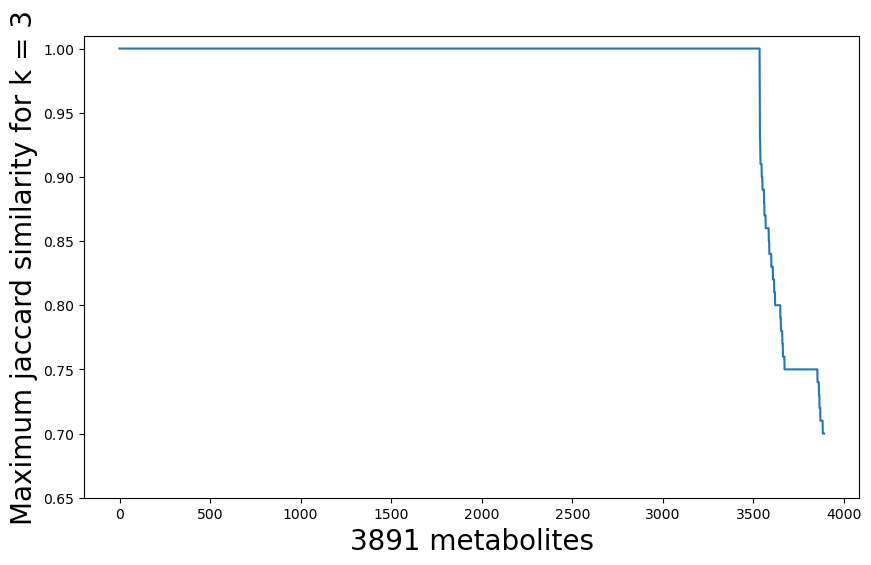

In [14]:
subset_final_df = final_df[final_df['max_jaccard'] >= 0.7]

ax = subset_final_df['max_jaccard'].plot(x='metabolite_ID',figsize=(10,6))

ax.set_ylim(0.65, 1.01)
ax.set_xlabel('%s metabolites'%len(subset_final_df['max_jaccard']),size=20)
ax.set_ylabel('Maximum jaccard similarity for k = %s'%k_value,size=20)

ax

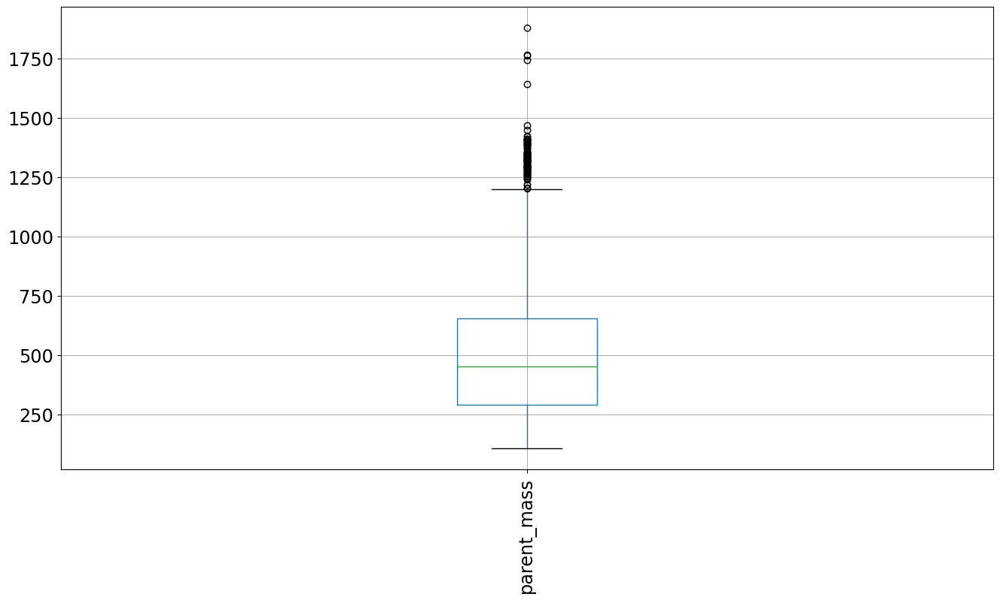

In [15]:
boxplot = pd.DataFrame(subset_final_df['parent_mass']).boxplot(figsize=[16,8],rot=90,fontsize='xx-large')

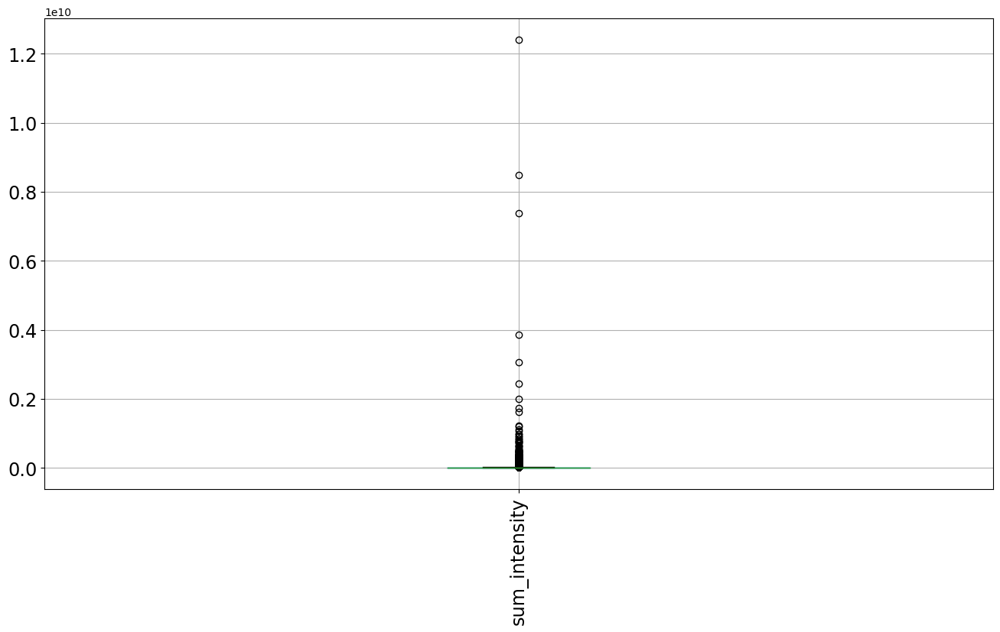

In [16]:
boxplot = pd.DataFrame(subset_final_df['sum_intensity']).boxplot(figsize=[16,8],rot=90,fontsize='xx-large')

In [17]:
end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
run_time = "{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds)
print(run_time)

00:10:03.55
